Reading Data

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import pickle
import scipy
import matplotlib as mpl
import matplotlib.pyplot as plt
np.random.seed(0)
sc.settings.verbosity = 3
sc.logging.print_versions()
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sc.settings.set_figure_params(dpi = 300)

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiwisolver          1.3.1


In [2]:
save_path = '/lustre/scratch117/cellgen/team292/ab55/'

In [3]:
adata = anndata.read_h5ad(save_path + "N3-pbmc-predictions.h5ad")
adata

AnnData object with n_obs × n_vars = 97499 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'leiden_scvi_subset_cc', 'leidenres2_scvi_subset_cc', 'leiden_tvi_subset_cc', 'leidenres2_tvi_subset_cc', 'louvain', 'Celltype_Predictions', 'Prediction_Probabilities'
    var

In [4]:
adata.obs

,souporcell,demultiplexed,sample_names,log2p1_count,percent_mito,n_genes,batch,FolderName,Lane,Sort,...,leiden_sampl_cc,leidenres2_sampl_cc,DonorSubset,leiden_scvi_subset_cc,leidenres2_scvi_subset_cc,leiden_tvi_subset_cc,leidenres2_tvi_subset_cc,louvain,Celltype_Predictions,Prediction_Probabilities
RV8919578_AAACCTGAGAAACCTA-1,singlet,CV19-I-O-3,RV8919578,11.406736,0.017318,1159,2,I-O-2_3_C-0,34527_1,None,...,9,13,True,2,10,15,23,18,NK_16hi,0.724055
RV8919578_AAACCTGAGAGCAATT-1,singlet,CV19-I-O-3,RV8919578,12.939213,0.026614,2058,2,I-O-2_3_C-0,34527_1,None,...,4,7,True,6,5,7,4,5,B_naive,0.945256
RV8919578_AAACCTGAGAGCTGGT-1,singlet,CV19-I-O-2,RV8919578,13.342491,0.007992,2597,2,I-O-2_3_C-0,34527_1,None,...,29,46,True,18,43,30,50,55,pDC,0.999999
RV8919578_AAACCTGAGCGAAGGG-1,singlet,CV19-I-O-3,RV8919578,12.463013,0.031887,1902,2,I-O-2_3_C-0,34527_1,None,...,5,2,True,2,3,4,3,9,NK_16hi,0.594061
RV8919578_AAACCTGAGCGATGAC-1,singlet,CV19-I-O-2,RV8919578,11.874598,0.034896,882,2,I-O-2_3_C-0,34527_1,None,...,9,13,True,5,10,15,23,18,NK_56hi,0.438167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RV8959686_TTTGTCAGTATGAATG-1,singlet,CV19-I-O-71,RV8959686,11.049168,0.131728,689,24,I-O-71_C-0,38186,None,...,9,22,True,3,2,5,13,8,NK_56hi,0.345042
RV8959686_TTTGTCAGTCGGCATC-1,singlet,CV19-I-O-71,RV8959686,11.604091,0.026028,1058,24,I-O-71_C-0,38186,None,...,28,33,True,13,25,21,27,30,B_naive,0.936518
RV8959686_TTTGTCAGTGACAAAT-1,singlet,CV19-I-O-71,RV8959686,11.200898,0.064173,792,24,I-O-71_C-0,38186,None,...,9,13,True,3,2,15,23,18,NK_56hi,0.457365
RV8959686_TTTGTCAGTTGCCTCT-1,singlet,CV19-I-O-71,RV8959686,12.747355,0.008582,1535,24,I-O-71_C-0,38186,None,...,7,6,True,1,9,2,6,26,CD4.IL22,0.512217


In [5]:
# cluster using the Louvain algorithm and initially use cell type predictions from logistic regression
sc.tl.louvain(adata, resolution = 1.0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 38 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:08)


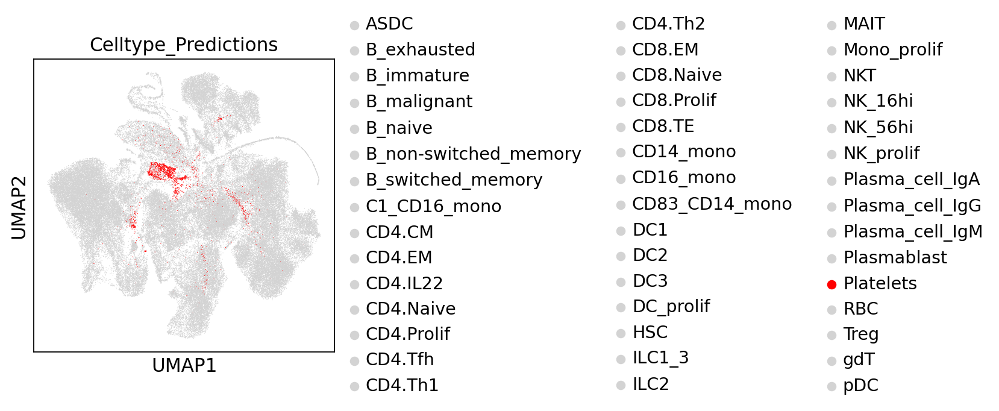

In [22]:
sc.settings.set_figure_params(dpi = 80)
sc.pl.umap(adata, color=['Celltype_Predictions'], palette = ['lightgrey']*40 + ['red'] + ['lightgrey']*45)

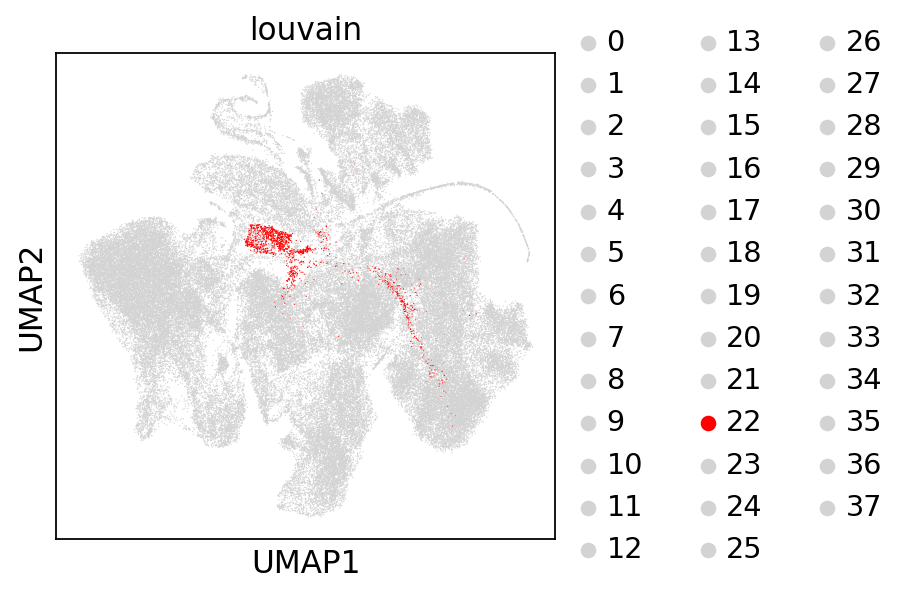

In [23]:
sc.pl.umap(adata, color=['louvain'], palette=['lightgrey']*22 + ['red'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'louvain_3', the cluster labels (adata.obs, categorical) (0:00:00)


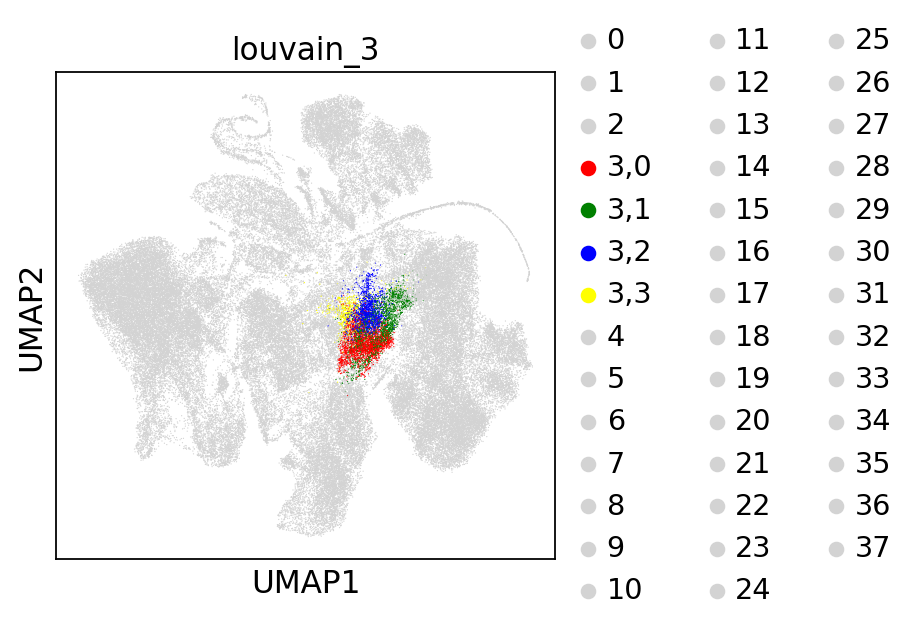

In [24]:
# zoom-in on cluster 3
sc.tl.louvain(adata, restrict_to=('louvain',['3']), key_added='louvain_3', resolution=0.2)
sc.pl.umap(adata, color=['louvain_3'], palette=['lightgrey']*3 + ['red','green', 'blue', 'yellow'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'louvain_4', the cluster labels (adata.obs, categorical) (0:00:00)


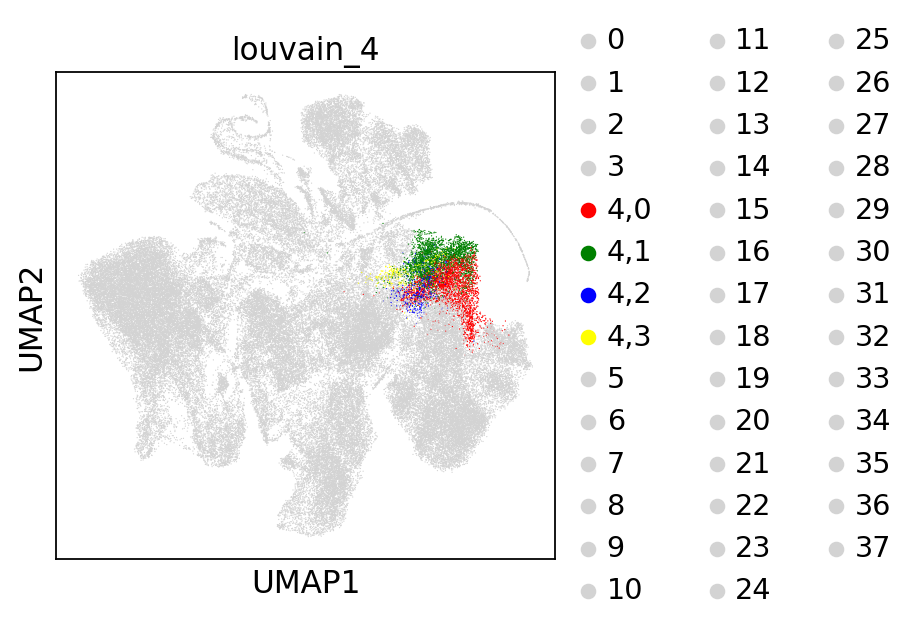

In [25]:
# zoom-in on cluster 4
sc.tl.louvain(adata, restrict_to=('louvain',['4']), key_added='louvain_4', resolution=0.2)
sc.pl.umap(adata, color=['louvain_4'], palette=['lightgrey']*4 + ['red','green', 'blue', 'yellow'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 42 clusters and added
    'louvain_5', the cluster labels (adata.obs, categorical) (0:00:00)


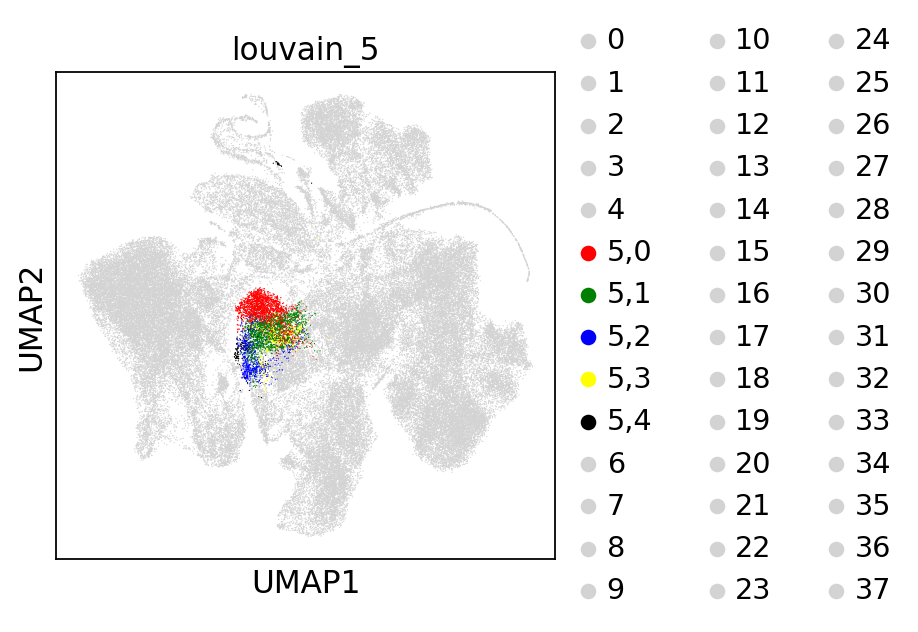

In [26]:
# zoom-in on cluster 5
sc.tl.louvain(adata, restrict_to=('louvain',['5']), key_added='louvain_5', resolution=0.2)
sc.pl.umap(adata, color=['louvain_5'], palette=['lightgrey']*5 + ['red','green', 'blue', 'yellow', 'black'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'louvain_6', the cluster labels (adata.obs, categorical) (0:00:00)


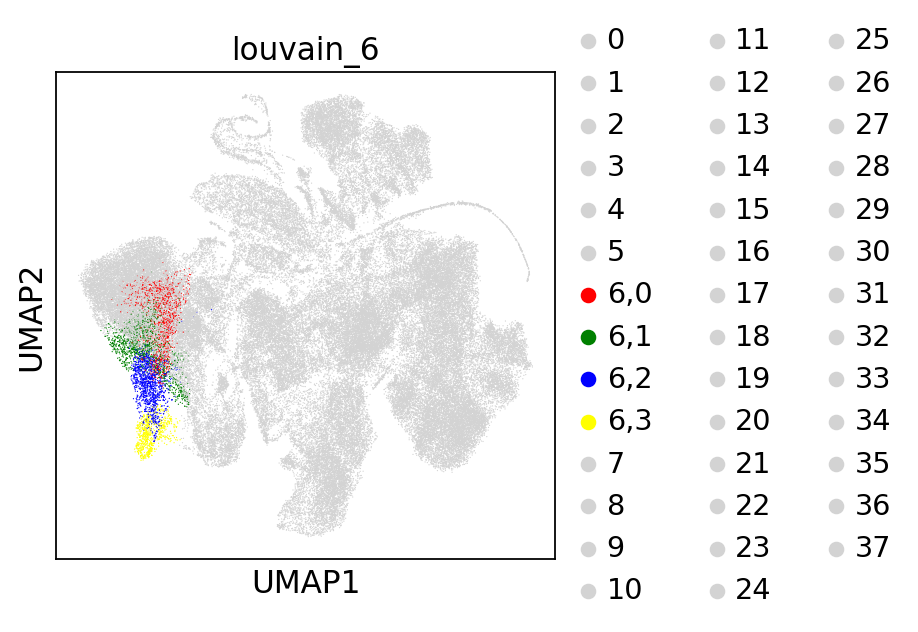

In [27]:
# zoom-in on cluster 6
sc.tl.louvain(adata, restrict_to=('louvain',['6']), key_added='louvain_6', resolution=0.2)
sc.pl.umap(adata, color=['louvain_6'], palette=['lightgrey']*6 + ['red','green', 'blue', 'yellow'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'louvain_7', the cluster labels (adata.obs, categorical) (0:00:00)


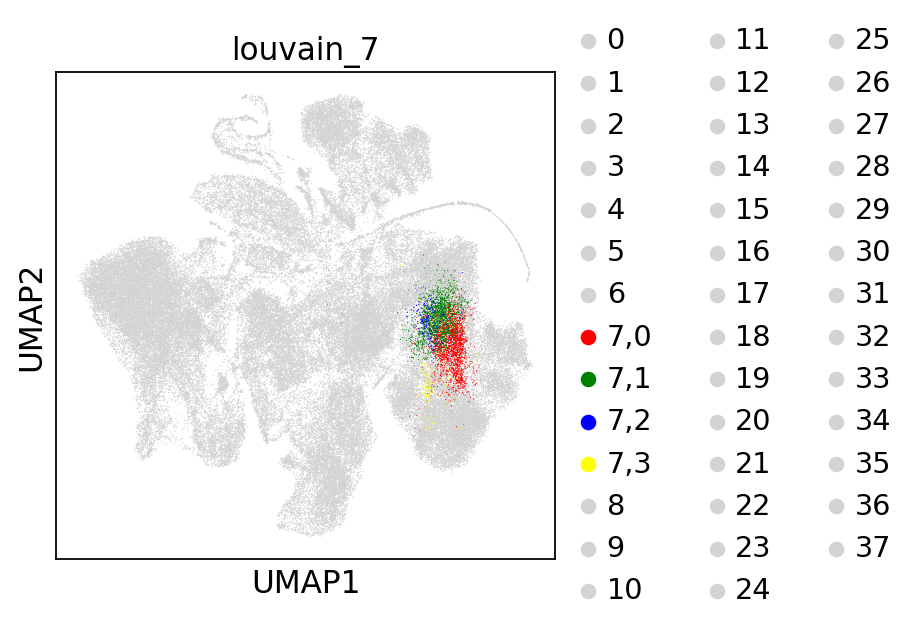

In [28]:
# zoom-in on cluster 7
sc.tl.louvain(adata, restrict_to=('louvain',['7']), key_added='louvain_7', resolution=0.2)
sc.pl.umap(adata, color=['louvain_7'], palette=['lightgrey']*7 + ['red','green', 'blue', 'yellow'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 42 clusters and added
    'louvain_9', the cluster labels (adata.obs, categorical) (0:00:00)


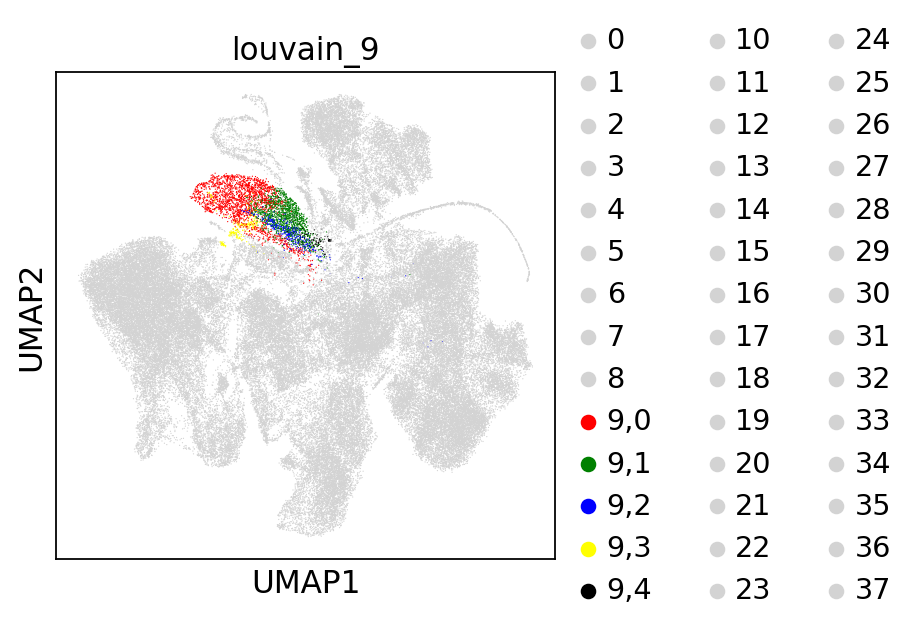

In [29]:
# zoom-in on cluster 9
sc.tl.louvain(adata, restrict_to=('louvain',['9']), key_added='louvain_9', resolution=0.14)
sc.pl.umap(adata, color=['louvain_9'], palette=['lightgrey']*9 + ['red','green', 'blue', 'yellow', 'black'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 46 clusters and added
    'louvain_9,0', the cluster labels (adata.obs, categorical) (0:00:00)


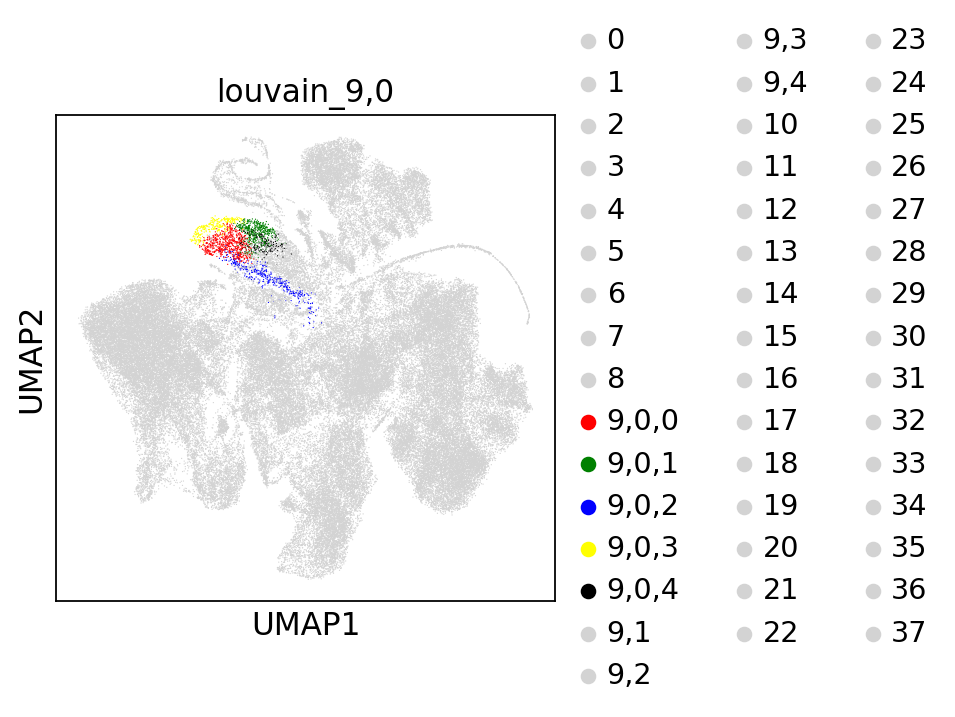

In [30]:
# zoom-in on cluster 9,0
sc.tl.louvain(adata, restrict_to=('louvain_9',['9,0']), key_added='louvain_9,0', resolution=0.3)
sc.pl.umap(adata, color=['louvain_9,0'], palette=['lightgrey']*9 + ['red','green', 'blue', 'yellow', 'black'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 44 clusters and added
    'louvain_9,3', the cluster labels (adata.obs, categorical) (0:00:00)


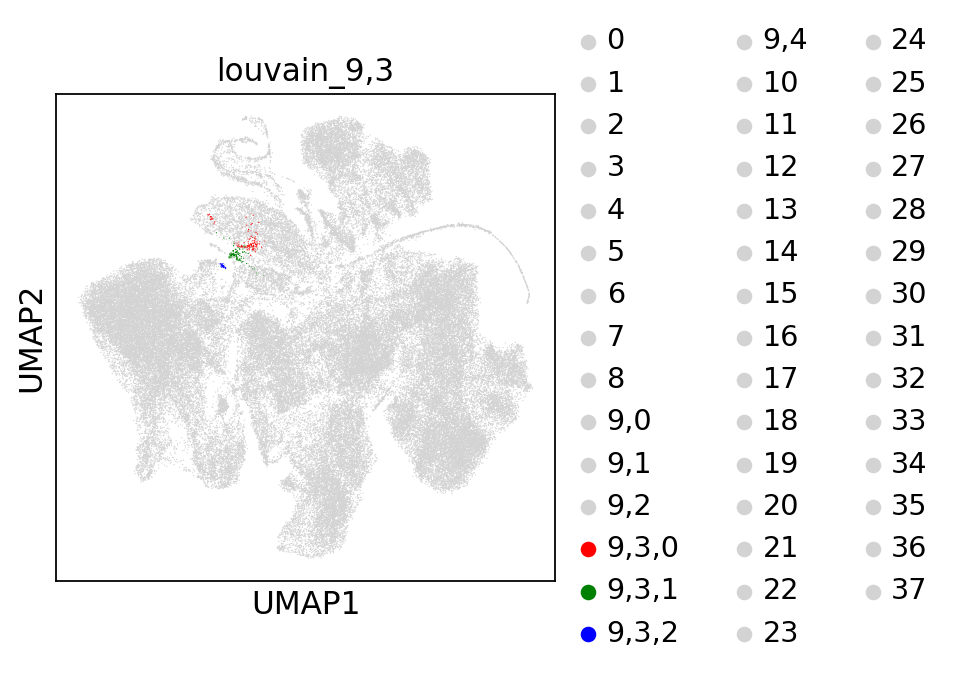

In [31]:
# zoom-in on cluster 9,3
sc.tl.louvain(adata, restrict_to=('louvain_9',['9,3']), key_added='louvain_9,3', resolution=0.1)
sc.pl.umap(adata, color=['louvain_9,3'], palette=['lightgrey']*12 + ['red','green', 'blue'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 42 clusters and added
    'louvain_11', the cluster labels (adata.obs, categorical) (0:00:00)


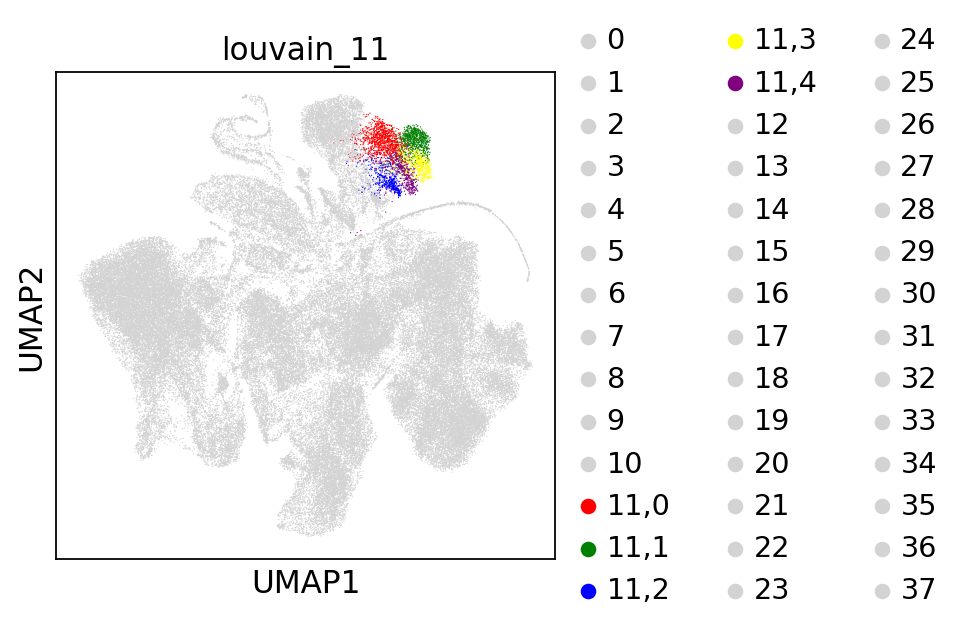

In [32]:
# zoom-in on cluster 11
sc.tl.louvain(adata, restrict_to=('louvain',['11']), key_added='louvain_11', resolution=0.3)
sc.pl.umap(adata, color=['louvain_11'], palette=['lightgrey']*11 + ['red','green', 'blue', 'yellow', 'purple'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 39 clusters and added
    'louvain_12', the cluster labels (adata.obs, categorical) (0:00:00)


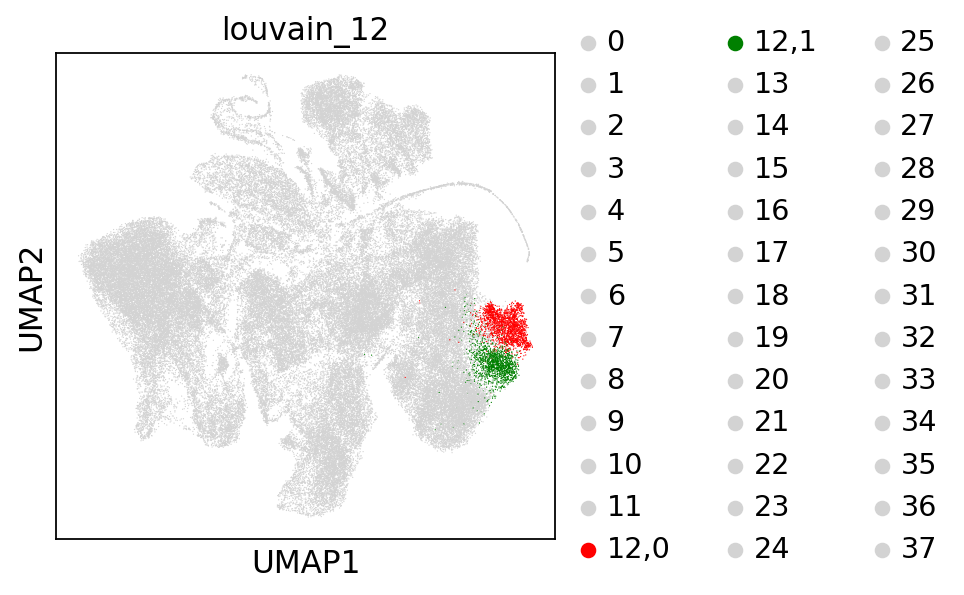

In [33]:
# zoom-in on cluster 12
sc.tl.louvain(adata, restrict_to=('louvain',['12']), key_added='louvain_12', resolution=0.1)
sc.pl.umap(adata, color=['louvain_12'], palette=['lightgrey']*12 + ['red','green'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'louvain_16', the cluster labels (adata.obs, categorical) (0:00:00)


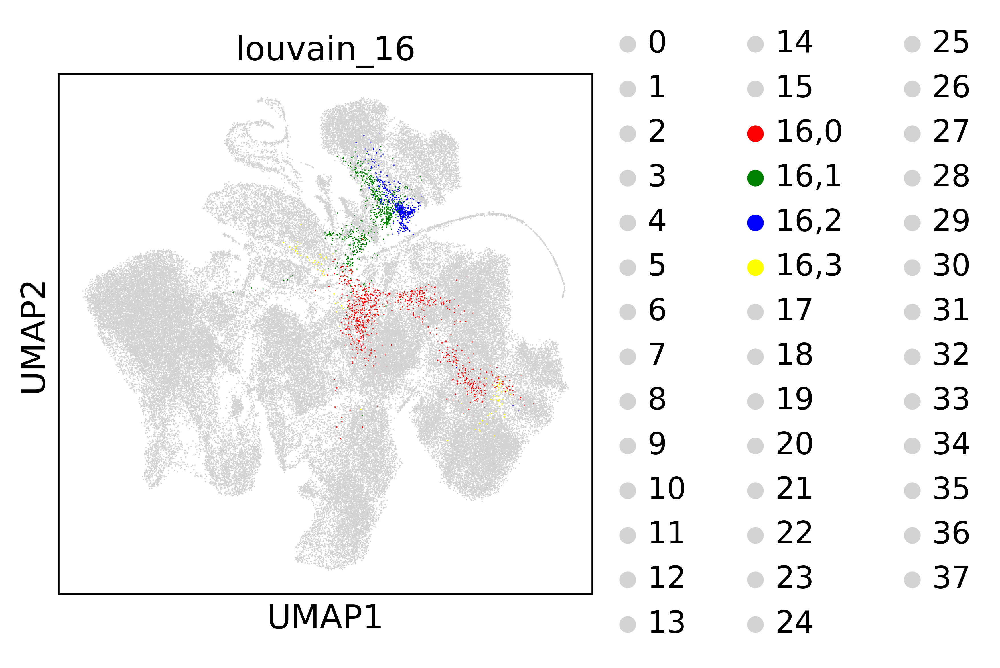

In [15]:
# zoom-in on cluster 16
sc.settings.set_figure_params(dpi = 300)
sc.tl.louvain(adata, restrict_to=('louvain',['16']), key_added='louvain_16', resolution=0.1)
sc.pl.umap(adata, color=['louvain_16'], palette=['lightgrey']*16 + ['red','green', 'blue', 'yellow'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 42 clusters and added
    'louvain_23', the cluster labels (adata.obs, categorical) (0:00:00)


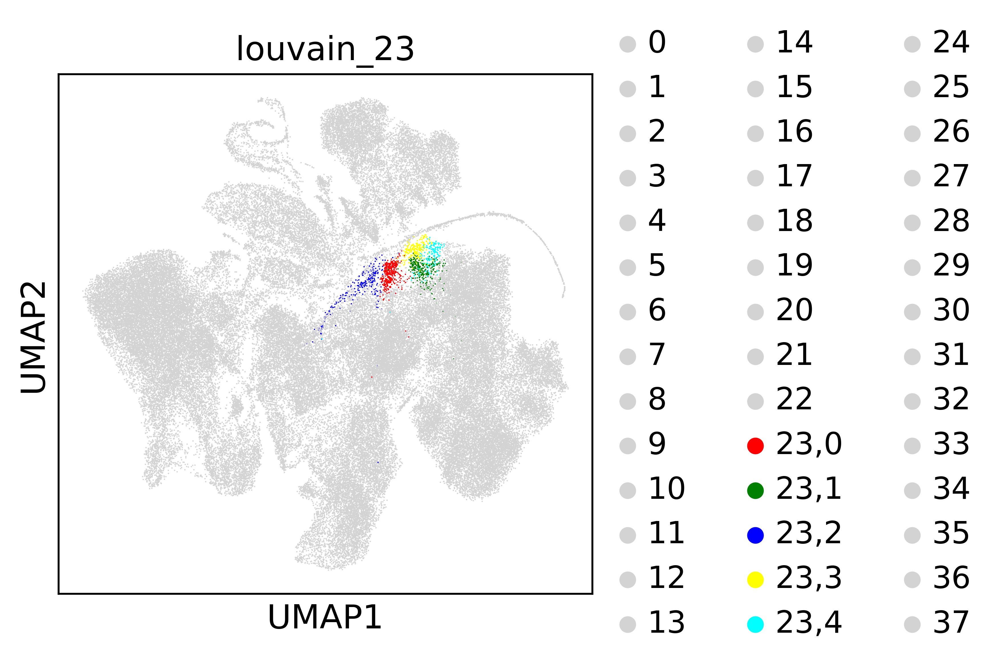

In [16]:
# zoom-in on cluster 23
sc.tl.louvain(adata, restrict_to=('louvain',['23']), key_added='louvain_23', resolution=0.4)
sc.pl.umap(adata, color=['louvain_23'], palette=['lightgrey']*23 + ['red','green', 'blue', 'yellow', 'aqua'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'louvain_27', the cluster labels (adata.obs, categorical) (0:00:00)


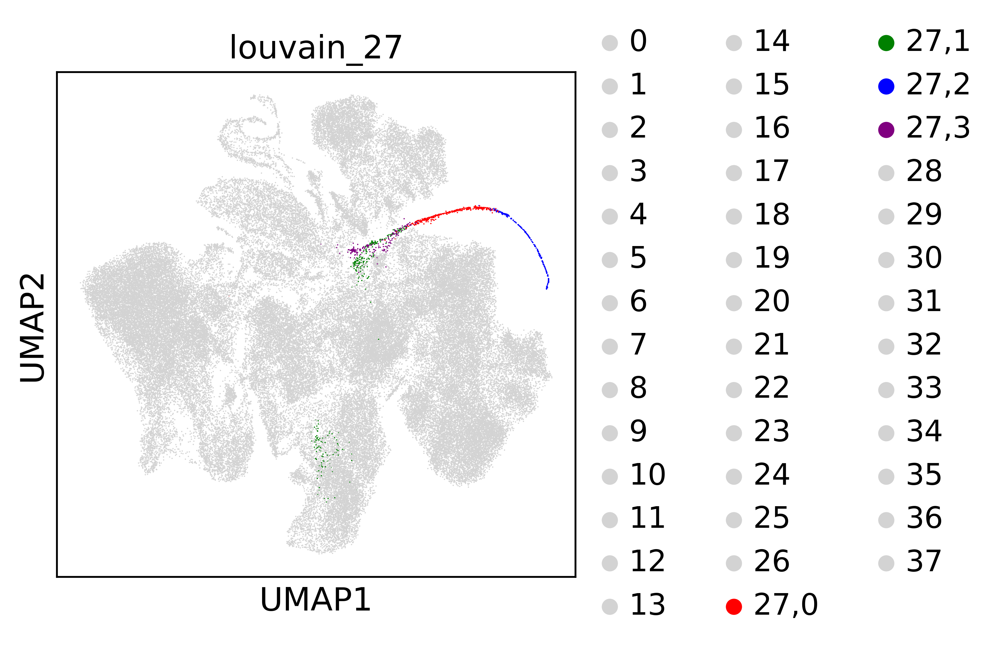

In [17]:
# zoom-in on cluster 27
sc.tl.louvain(adata, restrict_to=('louvain',['27']), key_added='louvain_27', resolution=0.1)
sc.pl.umap(adata, color=['louvain_27'], palette=['lightgrey']*27 + ['red','green', 'blue', 'purple'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 40 clusters and added
    'louvain_28', the cluster labels (adata.obs, categorical) (0:00:00)


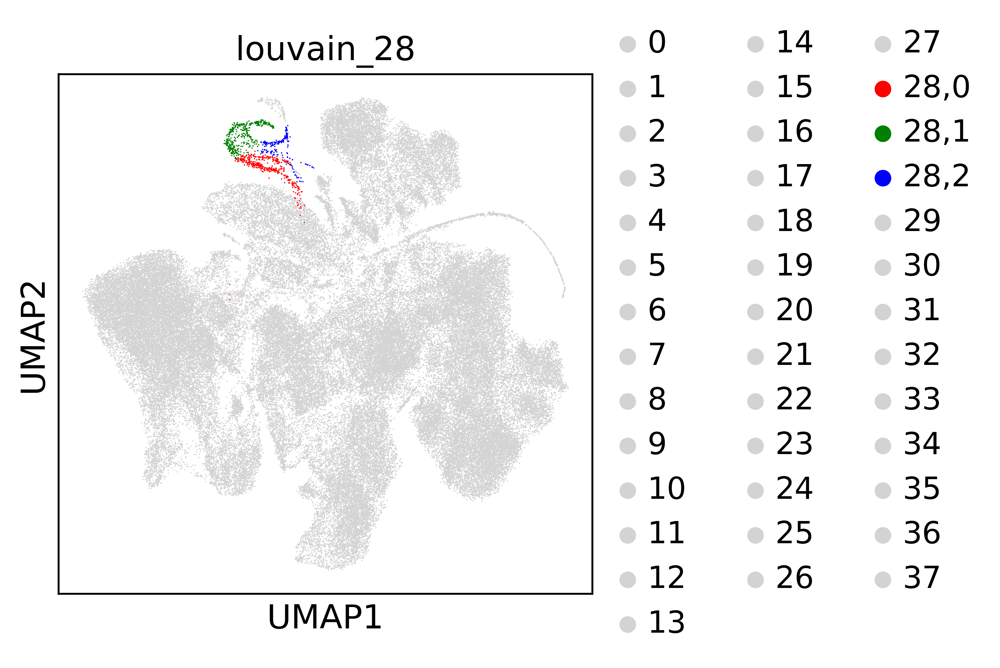

In [18]:
# zoom-in on cluster 28
sc.tl.louvain(adata, restrict_to=('louvain',['28']), key_added='louvain_28', resolution=0.1)
sc.pl.umap(adata, color=['louvain_28'], palette=['lightgrey']*28 + ['red','green', 'blue'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'louvain_32', the cluster labels (adata.obs, categorical) (0:00:00)


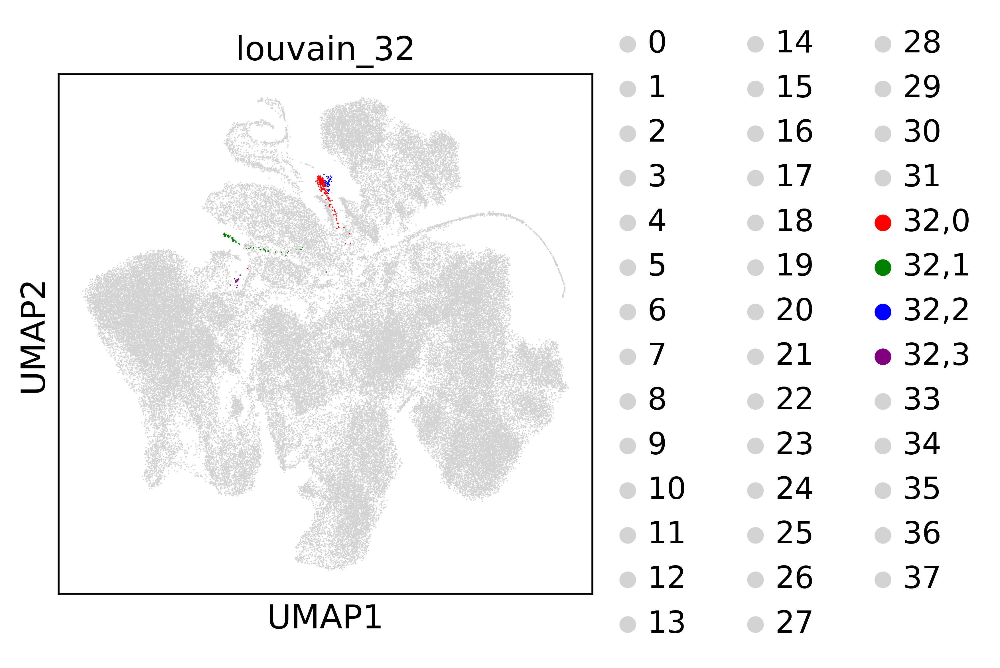

In [19]:
# zoom-in on cluster 32
sc.tl.louvain(adata, restrict_to=('louvain',['32']), key_added='louvain_32', resolution=0.2)
sc.pl.umap(adata, color=['louvain_32'], palette=['lightgrey']*32 + ['red','green', 'blue', 'purple'] + ['lightgrey']*40)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 41 clusters and added
    'louvain_37', the cluster labels (adata.obs, categorical) (0:00:00)


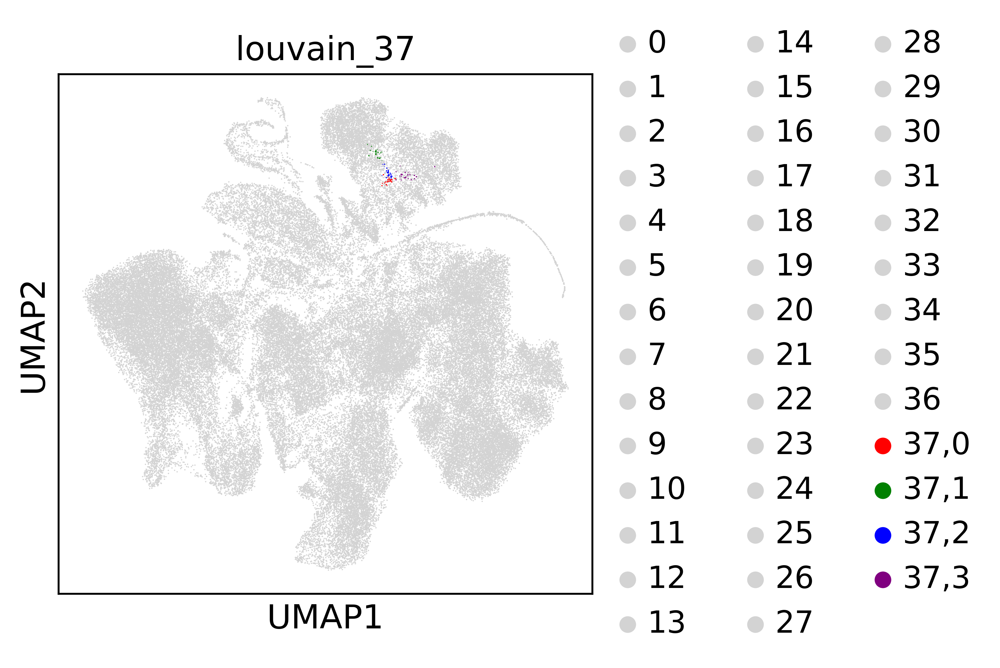

In [20]:
# zoom-in on cluster 37
sc.tl.louvain(adata, restrict_to=('louvain',['37']), key_added='louvain_37', resolution=0.5)
sc.pl.umap(adata, color=['louvain_37'], palette=['lightgrey']*37 + ['red','green', 'blue', 'purple'] + ['lightgrey']*40)

In [21]:
# define clusters
def Annotation(adata_obj, barcode):
    
    curr_louvain_coarse = adata_obj.obs.loc[barcode,'louvain']
    
    if curr_louvain_coarse in ['0', '13', '14', '15', '18', '24']:
        return('CD14 mono')
    
    elif curr_louvain_coarse in ['1', '19', '20', '21', '35']:
        return('CD4 naïve T')
    
    elif curr_louvain_coarse in ['2', '10', '25']:
        return('NK')
    
    elif curr_louvain_coarse in ['8', '26']:
        return('Naïve B')
    
    elif curr_louvain_coarse == '3':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_3']
        if zoomed_in_louvain in ['3,0', '3,2', '3,3']:
            return('CD8 cytotoxic T')
        elif zoomed_in_louvain in ['3,1']:
            return('CD8 memory T')
        
    elif curr_louvain_coarse == '4':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_4']
        if zoomed_in_louvain in ['4,0', '4,2', '4,3']:
            return('CD8 naïve T')
        elif zoomed_in_louvain in ['4,1']:
            return('CD4 memory T')
    
    elif curr_louvain_coarse == '5':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_5']
        if zoomed_in_louvain in ['5,0', '5,1']:
            return('CD4 naïve T')
        elif zoomed_in_louvain in ['5,2', '5,3', '5,4']:
            return('NK')
    
    elif curr_louvain_coarse == '6':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_6']
        if zoomed_in_louvain in ['6,0', '6,1']:
            return('CD14 mono')
        elif zoomed_in_louvain in ['6,2', '6,3']:
            return('CD16 mono')
    
    elif curr_louvain_coarse == '7':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_7']
        if zoomed_in_louvain in ['7,0', '7,3']:
            return('CD4 naïve T')
        elif zoomed_in_louvain in ['7,1', '7,2']:
            return('CD4 memory T')
    
    elif curr_louvain_coarse == '9':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_9']
        if zoomed_in_louvain in ['9,1', '9,2', '9,4']:
            return('RBC')
        elif zoomed_in_louvain == '9,0':
            zoomed_in_x2_louvain = adata_obj.obs.loc[barcode,'louvain_9,0']
            if zoomed_in_x2_louvain == '9,0,3':
                return('Plasmablast')
            elif zoomed_in_x2_louvain in ['9,0,0', '9,0,1', '9,0,2', '9,0,4']:
                return('RBC')
        elif zoomed_in_louvain == '9,3':
            zoomed_in_x2_louvain = adata_obj.obs.loc[barcode,'louvain_9,3']
            if zoomed_in_x2_louvain == '9,3,0':
                return('RBC')
            elif zoomed_in_x2_louvain in ['9,3,1', '9,3,2']:
                return('Plasmablast')
    
    elif curr_louvain_coarse == '11':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_11']
        if zoomed_in_louvain in ['11,0', '11,1', '11,2']:
            return('Naïve B')
        elif zoomed_in_louvain == '11,3':
            return('Exhausted B')
        elif zoomed_in_louvain == '11,4':
            return('Memory B')
    
    elif curr_louvain_coarse == '12':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_12']
        if zoomed_in_louvain == '12,0':
            return('CD8 naïve T')
        elif zoomed_in_louvain == '12,1':
            return('CD4 naïve T')
    
    elif curr_louvain_coarse == '16':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_16']
        if zoomed_in_louvain in ['16,1', '16,2']:
            return('Naïve B')
        elif zoomed_in_louvain in ['16,0', '16,3']:
            return('CD4 memory T')
    
    elif curr_louvain_coarse in ['17', '31']:
        return('CD4 memory T')
    
    elif curr_louvain_coarse == '22':
        return('Platelets')
    
    elif curr_louvain_coarse == '23':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_23']
        if zoomed_in_louvain == '23,0':
            return('CD8 memory T')
        elif zoomed_in_louvain in ['23,1', '23,3', '23,4']:
            return('CD4 naïve T')
        elif zoomed_in_louvain == '23,2':
            return('CD8 naïve T')
    
    elif curr_louvain_coarse == '27':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_27']
        if zoomed_in_louvain in ['27,0', '27,2', '27,3']:
            return('Prolif. T')
        elif zoomed_in_louvain == '27,1':
            return('NK')
    
    elif curr_louvain_coarse == '28':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_28']
        if zoomed_in_louvain in ['28,0', '28,2']:
            return('Plasmablast')
        elif zoomed_in_louvain == '28,1':
            return('Plasma B')
    
    elif curr_louvain_coarse == '29':
        return('CD8 cytotoxic T')
    
    elif curr_louvain_coarse == '30':
        return('Mono DC')
    
    elif curr_louvain_coarse == '32':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_32']
        if zoomed_in_louvain in ['32,0', '32,2', '32,3']:
            return('HSC')
        elif zoomed_in_louvain == '32,1':
            return('pDC')
        
    elif curr_louvain_coarse == '33':
        return('Neutrophil')
    
    elif curr_louvain_coarse == '34':
        return('RBC')
    
    elif curr_louvain_coarse == '36':
        return('Plasmablast')
    
    elif curr_louvain_coarse == '37':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_37']
        if zoomed_in_louvain == '37,0':
            return('Platelets')
        elif zoomed_in_louvain in ['37,1', '37,2']:
            return('Plasmablast')
        elif zoomed_in_louvain == '37,3':
            return('RBC')

    else:
        return('Unassigned')

In [22]:
# add results to the object
adata.obs['barcode'] = adata.obs.index
adata.obs['Initial_Celltype'] = adata.obs['barcode'].apply(lambda x: Annotation(adata, x))

In [301]:
np.unique(adata.obs['Initial_Celltype'])

array(['CD14 mono', 'CD16 mono', 'CD4 memory T', 'CD4 naïve T',
       'CD8 cytotoxic T', 'CD8 memory T', 'CD8 naïve T', 'Exhausted B',
       'HSC', 'Memory B', 'Mono DC', 'NK', 'Naïve B', 'Neutrophil',
       'Plasma B', 'Plasmablast', 'Platelets', 'Prolif. T', 'RBC', 'pDC'],
      dtype=object)

In [24]:
# define general cell type for manual annotation and refinement next
cluster2annotation = {
     'CD14 mono': 'CD14 mono',
     'CD16 mono': 'CD16 mono',
     'CD4 memory T': 'T-cells',
     'CD4 naïve T': 'T-cells',
     'CD8 cytotoxic T': 'T-cells',
     'CD8 memory T': 'T-cells',
     'CD8 naïve T': 'T-cells',
     'Exhausted B': 'Exhausted B',
     'HSC': 'HSC',
     'Memory B': 'Memory B',
     'Mono DC': 'DC',
     'NK': 'NK',
     'Naïve B': 'Naïve B',
     'Neutrophil': 'Neutrophil',
     'Plasma B': 'Plasma B',
     'Plasmablast': 'Plasmablast',
     'Platelets': 'Platelets',
     'Prolif. T': 'T-cells',
     'RBC': 'RBC',
     'pDC': 'pDC',
}

adata.obs['General_Celltype'] = adata.obs['Initial_Celltype'].map(cluster2annotation).astype('category')
np.unique(adata.obs['General_Celltype'])

array(['CD14 mono', 'CD16 mono', 'DC', 'Exhausted B', 'HSC', 'Memory B',
       'NK', 'Naïve B', 'Neutrophil', 'Plasma B', 'Plasmablast',
       'Platelets', 'RBC', 'T-cells', 'pDC'], dtype=object)

In [25]:
# Save results
Annotations_table = adata.obs.loc[:,['General_Celltype']]
Annotations_table.to_csv('./table_general_celltype_annotations.csv')
Annotations_table

,General_Celltype
RV8919578_AAACCTGAGAAACCTA-1,NK
RV8919578_AAACCTGAGAGCAATT-1,Naïve B
RV8919578_AAACCTGAGAGCTGGT-1,pDC
RV8919578_AAACCTGAGCGAAGGG-1,NK
RV8919578_AAACCTGAGCGATGAC-1,NK
...,...
RV8959686_TTTGTCAGTATGAATG-1,T-cells
RV8959686_TTTGTCAGTCGGCATC-1,Naïve B
RV8959686_TTTGTCAGTGACAAAT-1,NK
RV8959686_TTTGTCAGTTGCCTCT-1,T-cells


In [26]:
np.unique(Annotations_table['General_Celltype'])

array(['CD14 mono', 'CD16 mono', 'DC', 'Exhausted B', 'HSC', 'Memory B',
       'NK', 'Naïve B', 'Neutrophil', 'Plasma B', 'Plasmablast',
       'Platelets', 'RBC', 'T-cells', 'pDC'], dtype=object)

In [27]:
adata.write_h5ad(save_path + "N3-pbmc-initial-clustering.h5ad")

... storing 'Initial_Celltype' as categorical


End of Notebook